Imports

In [1]:
import torch
import torch.nn as nn
from torch.nn import Parameter
from torch.nn.utils import spectral_norm as SpectralNorm
import numpy as np
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision.datasets as datasets
from torchvision.transforms import transforms

In [2]:
!pip install kaggle

In [3]:
import json
import os
kaggle_dictionary=json.load(open('kaggle.json'))
os.environ['KAGGLE_USERNAME']=kaggle_dictionary['username']
os.environ['KAGGLE_KEY']=kaggle_dictionary['key']

In [4]:
!kaggle datasets download badasstechie/celebahq-resized-256x256

Dataset URL: https://www.kaggle.com/datasets/badasstechie/celebahq-resized-256x256
License(s): GPL-2.0
 77% 218M/283M [00:00<00:00, 739MB/s] 
100% 283M/283M [00:00<00:00, 737MB/s]


In [5]:
from zipfile import ZipFile
with ZipFile('/content/celebahq-resized-256x256.zip','r') as zip:
    zip.extractall()

Parameters

In [26]:
epochs = 50
batch_size = 32
learning_rate = 2e-4
latent_dim = 100
image_size = 64
n_critic = 1
conv_dim = 64

In [27]:
device=torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

Dataset

In [28]:

transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

In [9]:
!mkdir /content/celeba_hq_256/all_images
!mv /content/celeba_hq_256/*.jpg /content/celeba_hq_256/all_images/
!mv /content/celeba_hq_256/*.png /content/celeba_hq_256/all_images/

mv: cannot stat '/content/celeba_hq_256/*.png': No such file or directory


In [32]:
train_data=datasets.ImageFolder(root="/content/celeba_hq_256",transform=transform)

In [33]:
train_loader=DataLoader(train_data,batch_size=batch_size,shuffle=True,pin_memory=True)

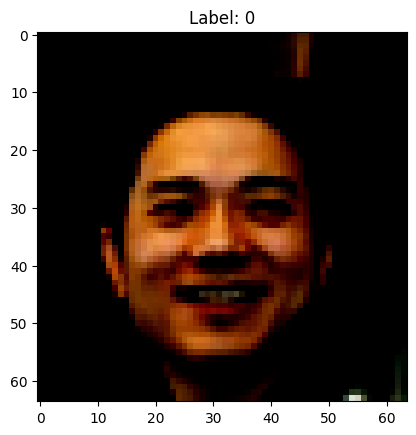

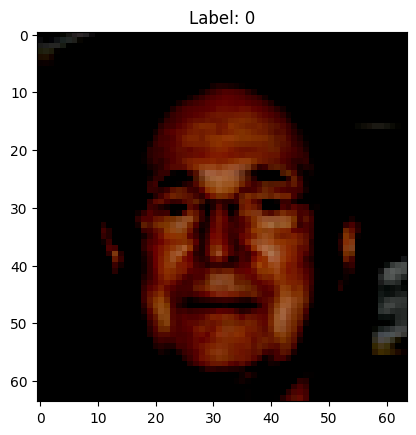

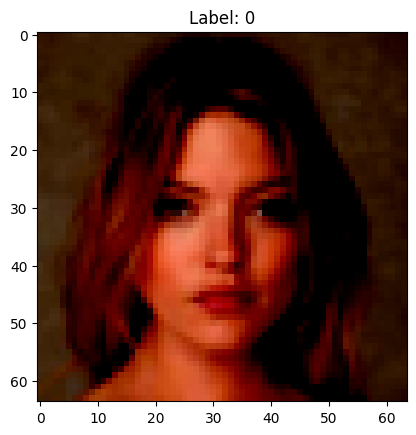

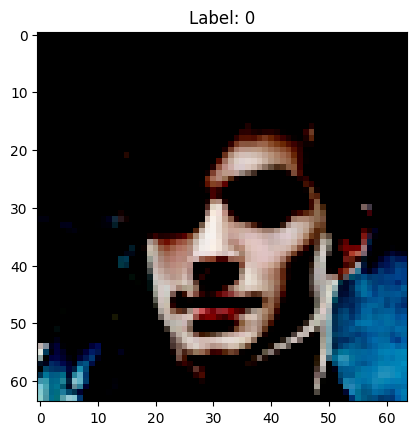

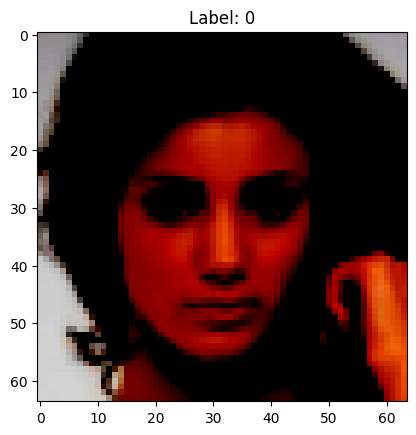

In [34]:
import matplotlib.pyplot as plt

for i in range(5):
    image, label = train_data[i]
    plt.imshow(image.permute(1, 2, 0))
    plt.title(f"Label: {label}")
    plt.show()

Self Attention Layer

In [35]:
class Self_Attention(nn.Module):
    def __init__(self,in_dim,activation):
      super().__init__()
      self.query = nn.Conv2d(in_dim,in_dim//8,kernel_size=1)
      self.key = nn.Conv2d(in_dim,in_dim//8,kernel_size=1)
      self.value = nn.Conv2d(in_dim,in_dim,kernel_size=1)
      self.gamma = nn.Parameter(torch.zeros(1))
      self.softmax = nn.Softmax(dim=-1)

    def forward(self,x):
      B,C,W,H=x.size()
      N=W*H
      proj_query = self.query(x).view(B,-1,N).permute(0,2,1)
      proj_key = self.key(x).view(B,-1,N)
      energy = torch.bmm(proj_query,proj_key)
      attention = self.softmax(energy)
      proj_value = self.value(x).view(B,-1,N)
      out = torch.bmm(proj_value,attention.permute(0,2,1))
      out = out.view(B,C,W,H)
      out = self.gamma*out + x
      return out,attention

Generator

In [69]:
class Generator(nn.Module):
  def __init__ (self,batch_size,img_size,z_dim,conv_dim):
    super().__init__()
    self.batch_size = batch_size
    self.img_size = img_size
    self.z_dim = z_dim
    self.conv_dim = conv_dim

    repeat_num=int(np.log2(self.img_size))-3
    mult=2**repeat_num

    self.layer1=nn.Sequential(
        SpectralNorm(nn.ConvTranspose2d(self.z_dim,self.conv_dim*mult,kernel_size=4)),
        nn.BatchNorm2d(self.conv_dim*mult),
        nn.ReLU()
    )

    curr_dim=conv_dim*mult

    self.layer2=nn.Sequential(
        SpectralNorm(nn.ConvTranspose2d(curr_dim,curr_dim//2,kernel_size=4,stride=2,padding=1)),
        nn.BatchNorm2d(curr_dim//2),
        nn.ReLU()
    )

    curr_dim=curr_dim//2

    self.layer3=nn.Sequential(
        SpectralNorm(nn.ConvTranspose2d(curr_dim,curr_dim//2,kernel_size=4,stride=2,padding=1)),
        nn.BatchNorm2d(curr_dim//2),
        nn.ReLU()
    )

    curr_dim = curr_dim // 2

    self.layer4 = nn.Sequential(
        SpectralNorm(nn.ConvTranspose2d(curr_dim, curr_dim // 2, kernel_size=4, stride=2, padding=1)),
        nn.BatchNorm2d(curr_dim // 2),
        nn.ReLU()
    )

    curr_dim = curr_dim // 2

    self.final = nn.Sequential(
        nn.ConvTranspose2d(curr_dim, 3, kernel_size=4, stride=2, padding=1),
        nn.Tanh()
    )

    self.attn1 = Self_Attention( 128, 'relu')
    self.attn2 = Self_Attention( 64,  'relu')

  def forward(self,z):
    z = z.view(z.size(0), z.size(1), 1, 1)
    out = self.layer1(z)
    out = self.layer2(out)
    out = self.layer3(out)
    out,p1 = self.attn1(out)
    out = self.layer4(out)
    out,p2 = self.attn2(out)
    out = self.final(out)

    return out,p1,p2

Discriminator

In [70]:
class Discriminator(nn.Module):
  def __init__ (self,batch_size,img_size,conv_dim):
    super().__init__()
    self.batch_size = batch_size
    self.img_size = img_size
    self.conv_dim = conv_dim

    self.layer1=nn.Sequential(
        SpectralNorm(nn.Conv2d(3,self.conv_dim,kernel_size=4,stride=2,padding=1)),
        nn.LeakyReLU(0.1)
    )

    curr_dim=conv_dim

    self.layer2=nn.Sequential(
        SpectralNorm(nn.Conv2d(curr_dim,curr_dim*2,kernel_size=4,stride=2,padding=1)),
        nn.LeakyReLU(0.1)
    )

    curr_dim=curr_dim*2

    self.layer3=nn.Sequential(
        SpectralNorm(nn.Conv2d(curr_dim,curr_dim*2,kernel_size=4,stride=2,padding=1)),
        nn.LeakyReLU(0.1)
    )

    curr_dim = curr_dim * 2

    self.layer4 = nn.Sequential(
        SpectralNorm(nn.Conv2d(curr_dim, curr_dim * 2, kernel_size=4, stride=2, padding=1)),
        nn.LeakyReLU(0.1)
    )

    curr_dim = curr_dim * 2

    self.final = nn.Sequential(
        nn.Conv2d(curr_dim, 1, kernel_size=4),
    )

    self.attn1 = Self_Attention( 256, 'relu')
    self.attn2 = Self_Attention( 512,  'relu')
  def forward(self,z):
    out = self.layer1(z)
    out = self.layer2(out)
    out = self.layer3(out)
    out,p1 = self.attn1(out)
    out = self.layer4(out)
    out,p2 = self.attn2(out)
    out = self.final(out)

    return out.squeeze(),p1,p2

In [71]:
generator=Generator(batch_size,image_size,latent_dim,conv_dim).to(device)
discriminator=Discriminator(batch_size,image_size,conv_dim).to(device)

In [72]:

optim_gen = optim.Adam(generator.parameters(), lr=learning_rate, betas=(0.0, 0.9))
optim_disc = optim.Adam(discriminator.parameters(), lr=learning_rate, betas=(0.0, 0.9))

In [73]:
def d_hinge_loss(real_logits, fake_logits):
    loss_real = torch.mean(nn.ReLU()(1.0 - real_logits))
    loss_fake = torch.mean(nn.ReLU()(1.0 + fake_logits))
    return loss_real + loss_fake

def g_hinge_loss(fake_logits):
    return -torch.mean(fake_logits)

In [74]:
import matplotlib.pyplot as plt
import os

def visualize_attention_map(attn_map, out_dir, epoch, layer_name, index=0, size=(16,16)):

    attn = attn_map[index].mean(dim=0)
    attn = attn.view(size).cpu().detach().numpy()

    plt.figure(figsize=(4, 4))
    plt.imshow(attn, cmap='viridis')
    plt.axis('off')
    os.makedirs(out_dir, exist_ok=True)
    plt.savefig(f"{out_dir}/epoch_{epoch+1}_{layer_name}.png", bbox_inches='tight')
    plt.close()


In [75]:
noise=torch.randn(batch_size,latent_dim,1,1).to(device)
fixed_noise = torch.randn(batch_size, latent_dim,1,1).to(device)

In [76]:

len(train_loader)

938

In [78]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [79]:
%tensorboard --logdir runs/

<IPython.core.display.Javascript object>

In [44]:
from torch.utils.tensorboard import SummaryWriter
from torchvision.utils import make_grid

Training Loop

In [83]:
writer = SummaryWriter()
for epoch in range(epochs):
  total_loss_d = 0.0
  total_loss_g = 0.0
  num_batches = len(train_loader)

  for batch,(real_img,_) in enumerate(train_loader):
    real_img=real_img.to(device)
    batch_size=real_img.shape[0]

    real_labels=torch.ones((batch_size,1)).to(device)* 0.9
    fake_labels=torch.zeros((batch_size,1)).to(device)

    #Training Discriminator
    noise=torch.randn(batch_size,latent_dim,1,1).to(device)
    fake_img,_,_=generator(noise)

    disc_real,_,_=discriminator(real_img)
    disc_fake,_,_=discriminator(fake_img.detach())

    loss_disc=d_hinge_loss(disc_real,disc_fake)
    discriminator.zero_grad()
    loss_disc.backward()
    optim_disc.step()

    total_loss_d += loss_disc.item()

    if batch%n_critic==0:
    #Training generator
      noise = torch.randn(batch_size, latent_dim, 1, 1).to(device)
      fake_img,_,_ = generator(noise)
      output,_,_=discriminator(fake_img)
      loss_gen=g_hinge_loss(output)
      generator.zero_grad()
      loss_gen.backward()
      optim_gen.step()
      total_loss_g += loss_gen.item()
  avg_loss_d = total_loss_d / num_batches
  avg_loss_g = total_loss_g / num_batches
  print(f"Epoch [{epoch+1}/{epochs}]  Loss_D: {avg_loss_d:.4f}  Loss_G: {avg_loss_g:.4f}")
  writer.add_scalar('Loss/Discriminator', avg_loss_d, epoch)
  writer.add_scalar('Loss/Generator', avg_loss_g, epoch)
  with torch.no_grad():
    samples,atten1,atten2 = generator(fixed_noise)
    grid = make_grid(samples, nrow=8, normalize=True)
    writer.add_image('Generated Images', grid, epoch)
    visualize_attention_map(atten1, "attention_maps", epoch, "G_attn1", index=0, size=(16, 16))
    visualize_attention_map(atten2, "attention_maps", epoch, "G_attn2", index=0, size=(32, 32))
writer.close()

Epoch [1/50]  Loss_D: 1.4820  Loss_G: 0.5785
Epoch [2/50]  Loss_D: 1.3630  Loss_G: 0.7294
Epoch [3/50]  Loss_D: 1.3233  Loss_G: 0.7587
Epoch [4/50]  Loss_D: 1.2875  Loss_G: 0.7535
Epoch [5/50]  Loss_D: 1.2356  Loss_G: 0.7739
Epoch [6/50]  Loss_D: 1.2085  Loss_G: 0.7798
Epoch [7/50]  Loss_D: 1.1829  Loss_G: 0.7967
Epoch [8/50]  Loss_D: 1.1628  Loss_G: 0.8103
Epoch [9/50]  Loss_D: 1.1320  Loss_G: 0.8291
Epoch [10/50]  Loss_D: 1.1105  Loss_G: 0.8428
Epoch [11/50]  Loss_D: 1.0910  Loss_G: 0.8618
Epoch [12/50]  Loss_D: 1.0790  Loss_G: 0.8600
Epoch [13/50]  Loss_D: 1.0541  Loss_G: 0.8794
Epoch [14/50]  Loss_D: 1.0274  Loss_G: 0.9067
Epoch [15/50]  Loss_D: 1.0126  Loss_G: 0.9334
Epoch [16/50]  Loss_D: 0.9835  Loss_G: 0.9508
Epoch [17/50]  Loss_D: 0.9624  Loss_G: 0.9724
Epoch [18/50]  Loss_D: 0.9456  Loss_G: 0.9778
Epoch [19/50]  Loss_D: 0.9250  Loss_G: 0.9885
Epoch [20/50]  Loss_D: 0.8941  Loss_G: 1.0360
Epoch [21/50]  Loss_D: 0.8595  Loss_G: 1.0861
Epoch [22/50]  Loss_D: 0.8362  Loss_G: 1.11

In [82]:
!rm -r runs